## Imports

In [1]:
# ===========================
# 1. First Cell: Standard Library and Third-Party Imports
# ===========================
print("Initializing environment and importing libraries...")

# Standard library imports
import os
import random
import time
import datetime
import warnings
import zipfile
import gc
import psutil
import math

# Third-party imports
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from PIL import Image
from tqdm import tqdm
from IPython.core.display_functions import clear_output
from IPython.display import display, HTML
from scipy import stats as scipy_stats

# TensorFlow and Keras imports
import tensorflow as tf
from tensorflow.keras import layers, backend as K, mixed_precision
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.layers import Layer, Conv2D, Conv2DTranspose, LeakyReLU, ReLU, Dropout, Concatenate, ZeroPadding2D

# ===========================
# 2. Second Cell: TensorFlow Configuration and GPU Setup
# ===========================
# Clean up any existing sessions
K.clear_session()
gc.collect()

# Configure TensorFlow behavior
warnings.filterwarnings('ignore')
tf.get_logger().setLevel('ERROR')
tf.config.optimizer.set_jit(True)  # Enable XLA optimization

# GPU setup and memory configuration
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"GPU memory growth enabled on {len(gpus)} device(s)")
    except RuntimeError as e:
        print(f"Error configuring GPU memory growth: {e}")

# System configuration summary
print("\nSystem Configuration:")
print("-" * 50)
print(f"TensorFlow version: {tf.__version__}")
print(f"Available devices: {tf.config.list_logical_devices()}")
print(f"CUDA available: {tf.test.is_built_with_cuda()}")
print(f"Number of GPUs: {len(gpus)}")
print("-" * 50)

# ===========================
# 3. Third Cell: Utility Functions
# ===========================
# Utility function to print memory usage
def print_memory_usage(step=""):
    """Print both CPU and GPU memory usage."""
    process = psutil.Process()
    cpu_mem = process.memory_info().rss / 1024 / 1024
    print(f"CPU Memory usage {step}: {cpu_mem:.2f} MB")
    
    # Add GPU memory tracking if available
    if tf.config.list_physical_devices('GPU'):
        try:
            gpu_mem = tf.config.experimental.get_memory_info('GPU:0')
            print(f"GPU Memory usage {step}: {gpu_mem['current'] / 1024 / 1024:.2f} MB")
        except:
            print("GPU memory tracking not supported.")

print("\nInitial memory usage:")
print_memory_usage()


Initializing environment and importing libraries...


2024-11-30 15:24:25.053171: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-30 15:24:25.053574: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-30 15:24:25.108391: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-30 15:24:25.231797: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-30 15:24:26.549638: W tensorflow/compiler/tf2

GPU memory growth enabled on 1 device(s)

System Configuration:
--------------------------------------------------
TensorFlow version: 2.15.0
Available devices: [LogicalDevice(name='/device:CPU:0', device_type='CPU'), LogicalDevice(name='/device:GPU:0', device_type='GPU')]
CUDA available: True
Number of GPUs: 1
--------------------------------------------------

Initial memory usage:
CPU Memory usage : 1561.48 MB
GPU Memory usage : 0.00 MB


2024-11-30 15:29:16.284893: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-11-30 15:29:16.285140: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-11-30 15:29:16.287203: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

# **2. Data Description**

## 2.1 Dataset Overview

The dataset for this project is provided by the Kaggle competition **"GAN Getting Started"**. It contains images of Claude Monet's paintings and ordinary photographs. The goal is to train a Generative Adversarial Network (GAN) to translate photos into Monet-style paintings.

The dataset consists of four main directories:

- **`monet_jpg/`**: Contains 300 Monet paintings in JPEG format.
- **`photo_jpg/`**: Contains 7,028 landscape photographs in JPEG format.
- **`monet_tfrec/`**: Contains the same 300 Monet paintings but stored in TFRecord format.
- **`photo_tfrec/`**: Contains the same 7,028 photographs but in TFRecord format.

### **Directory Contents:**

1. **`monet_jpg/`**
   - **Description**: This directory contains JPEG images of Claude Monet's paintings. Each image is sized at 256x256 pixels.
   - **Usage**: These images will be used to train the generator to learn Monet's style.

2. **`photo_jpg/`**
   - **Description**: This directory contains JPEG images of landscape photographs. Each image is also sized at 256x256 pixels.
   - **Usage**: These images will serve as input to the generator, which will attempt to translate them into Monet-style paintings.

3. **`monet_tfrec/`**
   - **Description**: Contains the Monet paintings in TFRecord format, which is TensorFlow's preferred format for storing a sequence of binary records.
   - **Usage**: Useful for efficient data loading when training with TensorFlow, especially on TPUs.

4. **`photo_tfrec/`**
   - **Description**: Contains the landscape photographs in TFRecord format.
   - **Usage**: Similar to `monet_tfrec/`, these are used for efficient data loading during training.

### **Dataset Structure:**

```
data/
├── monet_jpg/
│   ├── 0.jpg
│   ├── 1.jpg
│   ├── ...
│   └── 299.jpg
├── photo_jpg/
│   ├── 0.jpg
│   ├── 1.jpg
│   ├── ...
│   └── 7027.jpg
├── monet_tfrec/
│   ├── monet.tfrecords
└── photo_tfrec/
    ├── photo.tfrecords
```

### **Why Use TFRecords?**

- **Efficiency**: TFRecords are optimized for TensorFlow pipelines and can lead to faster data loading and training.
- **Scalability**: Better suited for large datasets and distributed training.
- **Flexibility**: Supports storing data in a serialized format, which can include images, labels, and other features.

However, for simplicity and ease of visualization, we will primarily use the JPEG images in this project.

---

## **2.2 Data Access**

We will start by defining the paths to our datasets and exploring the contents of each directory.

# Generating Monet-Style Images Using GANs

**Author:** Panagiotis S. Georgiadis 

---

## Abstract

This project involves building and training a Generative Adversarial Network (GAN) to generate images in the style of Claude Monet as part of the Kaggle "GAN Getting Started" competition. The objective is to explore GAN architectures for style transfer and to assess the generated images using the Memorization-informed Fréchet Inception Distance (MiFID) metric.

---

# 1. Introduction

## 1.1 Problem Statement

The advent of Generative Adversarial Networks (GANs) has significantly advanced the field of computer vision, enabling the generation of highly realistic images. This project focuses on applying GANs to generate images in the style of the renowned Impressionist painter, **Claude Monet**. The task is part of a Kaggle competition titled [**"GAN Getting Started"**](https://www.kaggle.com/c/gan-getting-started), where participants are challenged to create Monet-style images that can convincingly resemble authentic Monet paintings.

Generating Monet-style images is not just an exercise in artistic replication but also a meaningful exploration into the capabilities of AI in understanding and emulating complex artistic styles. Monet's work is characterized by vibrant colors and distinctive brush strokes that capture light and movement. Successfully generating images in his style demonstrates the potential of GANs in learning intricate patterns and textures inherent in fine art.

## 1.2 Generative Adversarial Networks (GANs) Overview

**Generative Adversarial Networks (GANs)** are a class of machine learning models introduced by Ian Goodfellow in 2014. GANs consist of two neural networks—the **generator** and the **discriminator**—that are trained simultaneously through an adversarial process:

- **Generator**: Learns to produce synthetic data (e.g., images) that resemble the real data distribution.
- **Discriminator**: Learns to distinguish between real data and data generated by the generator.

During training, the generator tries to produce images that are increasingly realistic, while the discriminator aims to become better at identifying fake images. This adversarial relationship pushes both networks to improve, resulting in the generator producing highly realistic images over time.

In the context of style transfer and image generation, GANs have been instrumental. Models like **CycleGAN** allow for unpaired image-to-image translation, making it possible to transform ordinary photographs into artworks of a specific style without needing one-to-one image mappings. This capability is particularly relevant for our project, where we aim to translate photos into Monet-style paintings.

## 1.3 Objective of the Project

The primary objective of this project is to build and train a GAN capable of generating images that emulate the artistic style of Claude Monet. Specifically, we aim to:

- **Develop a GAN model** that learns the Monet style from a dataset of Monet paintings.
- **Generate between 7,000 to 10,000 Monet-style images** in JPEG format with dimensions 256x256 pixels.
- **Evaluate the quality of the generated images** using the Memorization-informed Fréchet Inception Distance (**MiFID**) metric, as specified by the Kaggle competition.

To achieve these goals, we will undertake the following steps:

1. **Data Exploration and Preprocessing**
   - Load and visualize the Monet paintings and photos datasets.
   - Perform any necessary preprocessing steps such as resizing, normalization, and augmentation.

2. **Model Building**
   - Choose an appropriate GAN architecture (e.g., CycleGAN) for the task.
   - Implement the generator and discriminator networks with suitable layers and activation functions.

3. **Model Training**
   - Set up the training loop to train the GAN effectively.
   - Monitor training progress through loss functions and generate sample outputs at intervals.

4. **Image Generation and Saving**
   - Use the trained generator to create Monet-style images from the provided photos.
   - Save the generated images in the required format and prepare them for submission.

5. **Evaluation and Analysis**
   - Understand the MiFID metric and its significance.
   - Analyze the generated images qualitatively and discuss the model's performance.

6. **Discussion and Conclusion**
   - Summarize the findings and reflect on the challenges faced.
   - Propose potential improvements and future work.

By the end of this project, we hope to demonstrate the effectiveness of GANs in style transfer and contribute to the exploration of AI in the realm of art generation.

Dataset Files Found:
Monet TFRecord files: 5
Photo TFRecord files: 20

Counting images...


Processing datasets: 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]


Dataset,Number of Files,Total Images,Images per File
Monet,5,300,60.0
Photos,20,7038,351.9


Loading and displaying samples...


Processing datasets:   0%|          | 0/2 [00:00<?, ?it/s]


Displaying Monet samples:


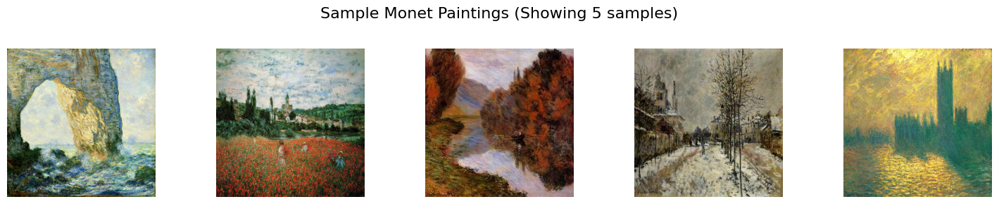

Processing datasets:  50%|█████     | 1/2 [00:00<00:00,  2.60it/s]


Displaying Photo samples:


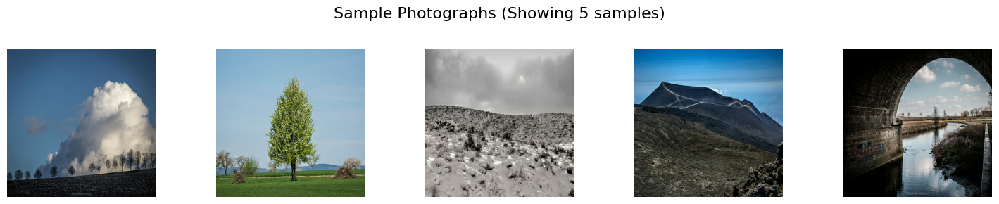

Processing datasets: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

Sample display complete!

Memory usage after clearing session:
CPU Memory usage : 1621.03 MB
GPU Memory usage : 0.00 MB


In [2]:
# ===========================
# 4. Fourth Cell: Dataset Preparation
# ===========================
# Define dataset paths
MONET_PATH = '/datasets/monet_tfrec/monet_tfrec/*.tfrec'
PHOTO_PATH = '/datasets/photo_tfrec/*.tfrec'

# Get TFRecord files
monet_tfrec_files = tf.io.gfile.glob(MONET_PATH)
photo_tfrec_files = tf.io.gfile.glob(PHOTO_PATH)

def count_images_in_tfrecord(tfrecord_files):
    """Count images in TFRecord files using parallel processing."""
    dataset = tf.data.Dataset.from_tensor_slices(tfrecord_files)
    dataset = dataset.interleave(
        lambda x: tf.data.TFRecordDataset(x).map(lambda _: tf.constant(1)),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    return int(dataset.reduce(0, lambda x, _: x + 1))

# Print initial file counts
print("Dataset Files Found:")
print(f"Monet TFRecord files: {len(monet_tfrec_files)}")
print(f"Photo TFRecord files: {len(photo_tfrec_files)}")

# Count total images with progress tracking
print("\nCounting images...")
with tqdm(total=2, desc="Processing datasets") as pbar:
    num_monet_images = count_images_in_tfrecord(monet_tfrec_files)
    pbar.update(1)
    num_photo_images = count_images_in_tfrecord(photo_tfrec_files)
    pbar.update(1)

    
# Store the computed number of images in global variables for later use
earlier_num_monet_images = num_monet_images
earlier_num_photo_images = num_photo_images
    
summary = f"""
<table style="width:100%; text-align:center">
    <tr>
        <th style="text-align:center">Dataset</th>
        <th style="text-align:center">Number of Files</th>
        <th style="text-align:center">Total Images</th>
        <th style="text-align:center">Images per File</th>
    </tr>
    <tr>
        <td>Monet</td>
        <td>{len(monet_tfrec_files)}</td>
        <td>{num_monet_images}</td>
        <td>{num_monet_images/len(monet_tfrec_files):.1f}</td>
    </tr>
    <tr>
        <td>Photos</td>
        <td>{len(photo_tfrec_files)}</td>
        <td>{num_photo_images}</td>
        <td>{num_photo_images/len(photo_tfrec_files):.1f}</td>
    </tr>
</table>
"""

display(HTML(summary))


# Constants for dataset configuration
IMG_SIZE = 256
CHANNELS = 3
BATCH_SIZE = 6
BUFFER_SIZE = 7038
CHANNEL_NAMES = ['Red', 'Green', 'Blue']


@tf.function
def parse_tfrecord(example_proto):
    """Parse TFRecord entries with standard normalization."""
    parsed_features = tf.io.parse_single_example(example_proto, {
        'image': tf.io.FixedLenFeature([], tf.string)
    })
    image = tf.io.decode_jpeg(parsed_features['image'], channels=3)
    image = tf.cast(image, tf.float32)
    
    # Normalize to [-1, 1]
    image = (image / 127.5) - 1.0
    
    return image

def create_dataset(tfrecord_files):
    """Create an optimized dataset from TFRecord files."""
    return (tf.data.TFRecordDataset(tfrecord_files, num_parallel_reads=tf.data.AUTOTUNE)
            .map(parse_tfrecord, num_parallel_calls=tf.data.AUTOTUNE)
            .prefetch(tf.data.AUTOTUNE))

def display_samples(dataset, title, num_samples=5):
    """Display sample images in a single row."""
    plt.figure(figsize=(15, 3))
    
    # Collect samples into a list
    samples = []
    for sample in dataset.take(num_samples):
        samples.append(sample)
    
    # Display available samples
    num_available = len(samples)
    for i in range(num_available):
        plt.subplot(1, num_samples, i + 1)
        # Convert to numpy and rescale to [0, 1]
        img = (samples[i].numpy() + 1) / 2
        plt.imshow(np.clip(img, 0, 1))
        plt.axis('off')
    
    plt.suptitle(f"{title} (Showing {num_available} samples)", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Create and display samples with progress tracking
print("Loading and displaying samples...")
with tqdm(total=2, desc="Processing datasets") as pbar:
    # Display Monet samples
    print("\nDisplaying Monet samples:")
    monet_dataset_display = create_dataset(monet_tfrec_files)
    display_samples(monet_dataset_display, "Sample Monet Paintings")
    pbar.update(1)
    
    # Display Photo samples
    print("\nDisplaying Photo samples:")
    photo_dataset_display = create_dataset(photo_tfrec_files)
    display_samples(photo_dataset_display, "Sample Photographs")
    pbar.update(1)

print("Sample display complete!")

# Clear previous session and free memory
K.clear_session()
gc.collect()

print("\nMemory usage after clearing session:")
print_memory_usage()


### Observations:

- All images are in **JPEG** format.
- Images are in **RGB** mode.
- All images are sized at **256x256** pixels.

This consistency simplifies our preprocessing steps, as we don't need to handle images of varying sizes or color modes.

The dataset provides a solid foundation for training a GAN to translate photos into Monet-style paintings. With 300 Monet paintings and over 7,000 photographs, the model will have sufficient data to learn from.

Next, we will proceed to **Exploratory Data Analysis (EDA)** to visualize and understand the data better.


# **3. Exploratory Data Analysis (EDA)**

In this section, we will explore the dataset by visualizing sample images and analyzing data statistics to gain insights into the characteristics of the Monet paintings and the photographs.

## **3.1 Data Visualization**

### **Display Sample Images**

Let's display a few sample images from both the Monet paintings and the photographs to visually compare and contrast their styles.


### **Observations**

- **Monet Paintings:**
  - Characterized by vibrant and pastel colors.
  - Loose brush strokes creating an impressionistic effect.
  - Emphasis on light and its changing qualities.
  - Subjects often include landscapes, water lilies, gardens, and scenes of nature.

- **Photographs:**
  - Realistic representation of landscapes.
  - Clear and sharp details.
  - Wide range of colors, shadows, and lighting conditions.
  - Subjects include mountains, forests, bodies of water, and other natural scenes.

By visually comparing the images, we can observe the stylistic differences that the GAN model needs to learn in order to transform photographs into Monet-style paintings.

## **3.2 Data Statistics**

### **Analyze Image Dimensions and Color Channels**

Although we've previously checked the image dimensions and formats for a couple of images, we'll now verify that all images have consistent dimensions and color channels.


Analyzing Monet dataset...


300it [00:05, 57.58it/s]


KeyboardInterrupt: 

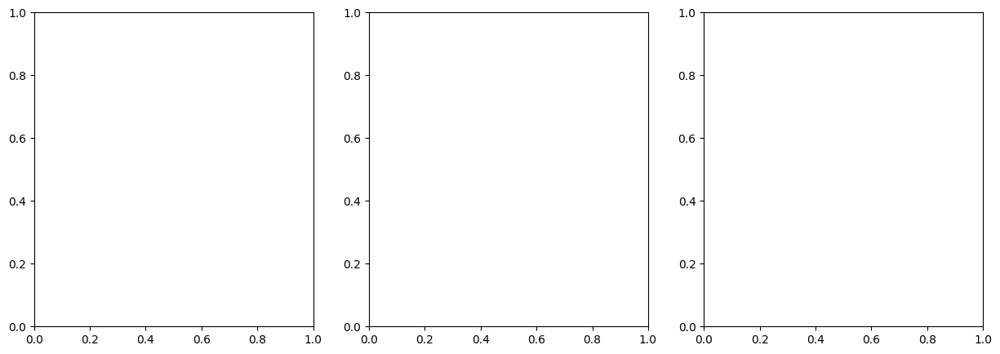

In [3]:
# Constants
CHANNELS = ['Red', 'Green', 'Blue']
NUM_SAMPLES = 300


def analyze_dataset(tfrecord_files, name):
    """Analyze a dataset with comprehensive statistics."""
    print(f"\nAnalyzing {name} dataset...")
    # Use the existing parse_tfrecord function and create_dataset function
    dataset = create_dataset(tfrecord_files)
    
    # Collect samples and compute statistics
    channel_values = [[], [], []]
    means, stds = [], []
    skewness_vals = np.zeros((NUM_SAMPLES, 3))
    kurtosis_vals = np.zeros((NUM_SAMPLES, 3))
    percentiles_vals = np.zeros((NUM_SAMPLES, 3, 5))
    
    for i, image in enumerate(tqdm(dataset.take(NUM_SAMPLES))):
        img_np = image.numpy()
        
        # Per-channel analysis
        for c in range(3):
            channel = img_np[:,:,c].flatten()
            channel_values[c].extend(channel)
            skewness_vals[i, c] = scipy_stats.skew(channel)
            kurtosis_vals[i, c] = scipy_stats.kurtosis(channel)
            percentiles_vals[i, c] = np.percentile(channel, [1, 25, 50, 75, 99])
        
        means.append(np.mean(img_np, axis=(0, 1)))
        stds.append(np.std(img_np, axis=(0, 1)))
    
    # Compute final statistics
    final_stats = {
        'mean': np.mean(means, axis=0),
        'std': np.mean(stds, axis=0),
        'skewness': np.mean(skewness_vals, axis=0),
        'kurtosis': np.mean(kurtosis_vals, axis=0),
        'percentiles': np.mean(percentiles_vals, axis=0)
    }
    
    # Plot channel distributions
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    colors = ['red', 'green', 'blue']
    
    for i, (values, color, channel) in enumerate(zip(channel_values, colors, CHANNELS)):
        axes[i].hist(values, bins=50, color=color, alpha=0.7)
        axes[i].axvline(final_stats['mean'][i], color='black', linestyle='--', 
                       label=f'Mean: {final_stats["mean"][i]:.3f}')
        axes[i].axvline(final_stats['mean'][i] + final_stats['std'][i], color='gray', 
                       linestyle=':', label=f'±Std: {final_stats["std"][i]:.3f}')
        axes[i].axvline(final_stats['mean'][i] - final_stats['std'][i], color='gray', linestyle=':')
        axes[i].set_title(f"{channel} Channel")
        axes[i].set_xlabel("Pixel Intensity [-1, 1]")
        axes[i].set_ylabel("Frequency" if i == 0 else "")
        axes[i].legend()
    
    plt.suptitle(f"{name} Channel Distributions", y=1.05)
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"\n{name} Statistics")
    print("-" * 50)
    print("\nChannel Statistics:")
    
    for i, channel in enumerate(CHANNELS):
        print(f"\n{channel} Channel:")
        print(f"  Mean: {final_stats['mean'][i]:.3f}")
        print(f"  Std Dev: {final_stats['std'][i]:.3f}")
        print(f"  Skewness: {final_stats['skewness'][i]:.3f}")
        print(f"  Kurtosis: {final_stats['kurtosis'][i]:.3f}")
        print(f"  Percentiles (1, 25, 50, 75, 99): {final_stats['percentiles'][i]}")
    
    return final_stats

# Run analysis
monet_stats = analyze_dataset(monet_tfrec_files, "Monet")
photo_stats = analyze_dataset(photo_tfrec_files, "Photo")

**Conclusion of EDA:**

- The datasets are generally consistent in terms of image sizes and color modes.
- Visual exploration confirms the stylistic differences between Monet paintings and photographs.
- The imbalance in dataset sizes is noted, and we may address this during the model training phase.

---

# **4. Data Preprocessing**

In this section, we'll prepare the data for training the GAN. This involves normalizing the images, converting them to tensors, and setting up efficient data loaders.

## **Image Preprocessing and Data Loaders**

### **Normalization and Conversion to Tensors**

To ensure that the images are in a suitable format for the GAN, we'll perform the following preprocessing steps:

- **Resize Images**: Our images are already sized at 256x256 pixels, so resizing is not necessary.
- **Normalize Pixel Values**: Scale pixel values to the range [-1, 1], which is common for GANs using the `tanh` activation function in the generator's output layer.
- **Convert to Tensors**: Convert images into TensorFlow tensors for efficient computation during training.

### **Creating Efficient Data Pipelines**

We'll now set up data loaders that:

- Batch the data.
- Shuffle the datasets.
- Prefetch batches for optimal performance.

Verification of Updated Constants:

Monet Statistics:
Red Channel:
  Mean: 0.043
  Std:  0.382
Green Channel:
  Mean: 0.048
  Std:  0.361
Blue Channel:
  Mean: -0.046
  Std:  0.385
Creating datasets...

Using precomputed dataset sizes:
Number of Monet images: 300
Number of Photo images: 7038
Repeating Monet dataset 23 times and adding leftover 138 images to exactly match Photo dataset size of 7038.

Creating Monet dataset with augmentation...

Creating Photo dataset with augmentation...

Counting samples in dataset...


1173it [00:22, 53.24it/s]



Dataset Size:
Photo images: 7038
Monet images: 7038
Ratio (Monet/Photo): 1.00

Displaying before and after augmentation samples...


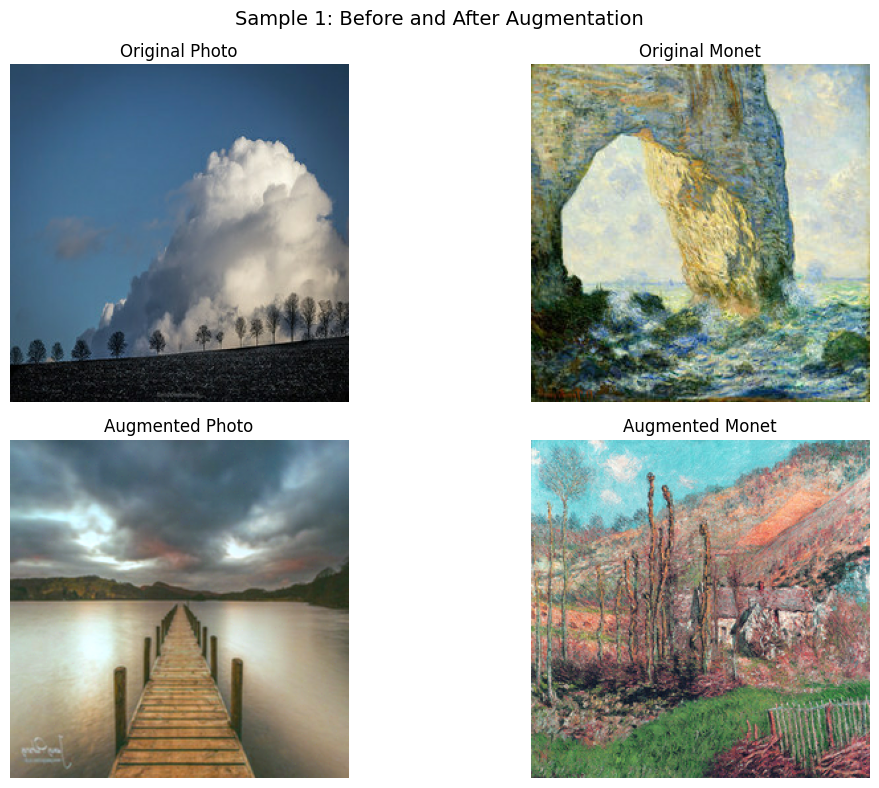


Batch 1 shapes:
Photo: (6, 256, 256, 3)
Monet: (6, 256, 256, 3)


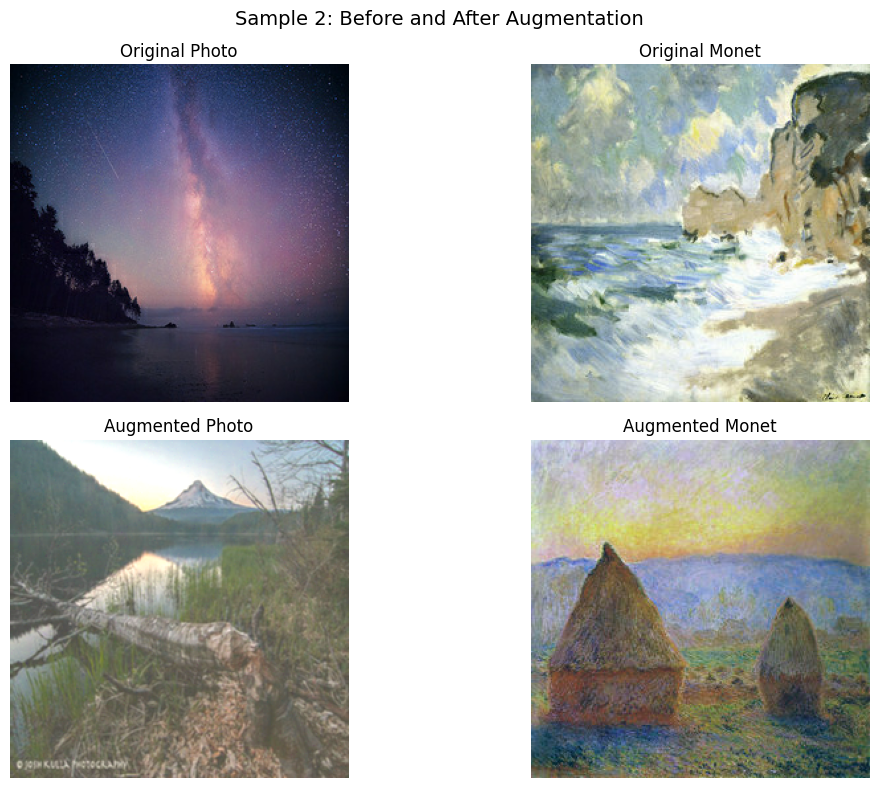


Batch 2 shapes:
Photo: (6, 256, 256, 3)
Monet: (6, 256, 256, 3)


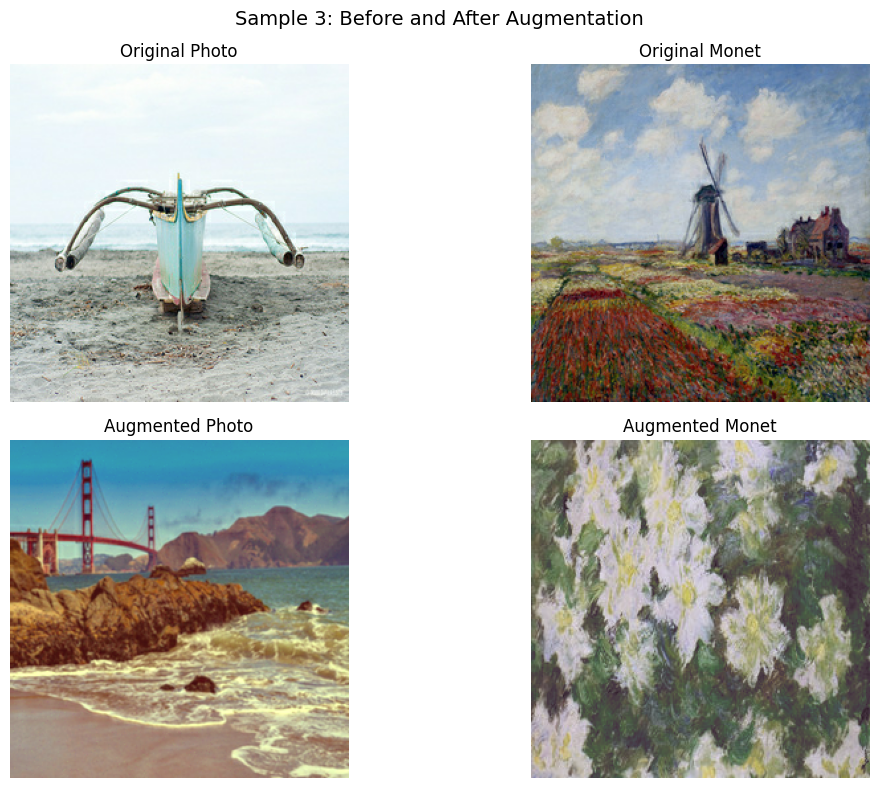


Batch 3 shapes:
Photo: (6, 256, 256, 3)
Monet: (6, 256, 256, 3)




Dataset Statistics:
--------------------------------------------------

Target Values:
Monet Mean RGB: [ 0.043  0.048 -0.046]
Monet Std RGB: [0.382 0.361 0.385]

Actual Values:

Photo Dataset:
Mean RGB: [ 0.04249353  0.04782706 -0.04555293]
Std RGB: [0.37603042 0.355147   0.37908813]

Monet Dataset:
Mean RGB: [ 0.04308622  0.04819435 -0.04522574]
Std RGB: [0.37819326 0.35836536 0.38002422]

Steps per epoch: 1173

Verifying final dataset...
CPU Memory usage : 12828.32 MB
GPU Memory usage : 0.01 MB
Dataset shape verification:
Photo batch shape: (6, 256, 256, 3)
Monet batch shape: (6, 256, 256, 3)
Augmented Photo - min: -1.0 max: 1.0
Augmented Monet - min: -1.0 max: 1.0

✅ Dataset ready for training!


In [3]:

# Updated based on our actual data analysis
MONET_MEAN = tf.constant([0.043, 0.048, -0.046], dtype=tf.float32)  # Red, Green, Blue
MONET_STD = tf.constant([0.382, 0.361, 0.385], dtype=tf.float32)
PHOTO_MEAN = tf.constant([-0.207, -0.200, -0.237], dtype=tf.float32)
PHOTO_STD = tf.constant([0.446, 0.406, 0.441], dtype=tf.float32)

# Print verification of the updated constants
print("Verification of Updated Constants:")
print("\nMonet Statistics:")
for i, channel in enumerate(CHANNEL_NAMES):
    print(f"{channel} Channel:")
    print(f"  Mean: {MONET_MEAN[i]:.3f}")
    print(f"  Std:  {MONET_STD[i]:.3f}")
    
# ===========================
# 5. Fifth Cell: Data Augmentation Functions
# ===========================
@tf.function
def gaussian_blur(image, sigma=1.0):
    """Apply Gaussian blur using TF operations."""
    kernel_size = tf.maximum(3, tf.cast(2 * tf.round(3.0 * sigma) + 1, tf.int32))
    radius = kernel_size // 2
    
    # Create Gaussian kernel
    x = tf.range(-radius, radius + 1, dtype=tf.float32)
    gaussian = tf.exp(-0.5 * x ** 2 / sigma ** 2)
    kernel = gaussian[:, tf.newaxis] * gaussian[tf.newaxis, :]
    kernel = kernel / tf.reduce_sum(kernel)
    
    # Prepare kernel for convolution
    kernel_4d = tf.tile(kernel[:, :, tf.newaxis, tf.newaxis], [1, 1, 3, 1])
    
    # Apply convolution with reflection padding
    padded = tf.pad(image[tf.newaxis], [[0, 0], [radius, radius], [radius, radius], [0, 0]], 'REFLECT')
    return tf.squeeze(tf.nn.depthwise_conv2d(padded, kernel_4d, [1, 1, 1, 1], 'VALID'), 0)

@tf.function
def directional_blur(image, angle=45, kernel_size=5):
    """Apply directional blur using TF operations."""
    angle_rad = tf.cast(angle * np.pi / 180.0, tf.float32)
    
    # Calculate directional offsets
    dx = tf.cast(tf.cast(kernel_size, tf.float32) * tf.cos(angle_rad), tf.int32)
    dy = tf.cast(tf.cast(kernel_size, tf.float32) * tf.sin(angle_rad), tf.int32)
    
    # Create kernel grid
    y_indices, x_indices = tf.meshgrid(
        tf.range(kernel_size),
        tf.range(kernel_size)
    )
    
    center = kernel_size // 2
    x_pos = center + dx * (x_indices - center)
    y_pos = center + dy * (y_indices - center)
    
    # Create and normalize kernel
    valid_mask = tf.logical_and(
        tf.logical_and(x_pos >= 0, x_pos < kernel_size),
        tf.logical_and(y_pos >= 0, y_pos < kernel_size)
    )
    kernel = tf.zeros([kernel_size, kernel_size], dtype=tf.float32)
    kernel = tf.tensor_scatter_nd_update(
        kernel,
        tf.where(valid_mask),
        tf.ones([tf.reduce_sum(tf.cast(valid_mask, tf.int32))], dtype=tf.float32)
    )
    kernel = kernel / tf.reduce_sum(kernel)
    
    # Apply convolution
    kernel_4d = tf.tile(kernel[:, :, tf.newaxis, tf.newaxis], [1, 1, 3, 1])
    padded = tf.pad(image[tf.newaxis], [[0, 0], [center, center], [center, center], [0, 0]], 'REFLECT')
    return tf.squeeze(tf.nn.depthwise_conv2d(padded, kernel_4d, [1, 1, 1, 1], 'VALID'), 0)

@tf.function
def augment_photo_image(image):
    """Augment photo images and adjust statistics to match Monet style."""
    # Random flipping for data augmentation
    image = tf.image.random_flip_left_right(image)
    
    # Apply reduced Gaussian and directional blur for a sharper effect
    sigma = tf.random.uniform([], 0.01, 0.03)  # Lower sigma for less Gaussian blur
    image = gaussian_blur(image, sigma)
    angle = tf.random.uniform([], 0, 90)  # Reduce angle range for directional blur
    image = directional_blur(image, angle, kernel_size=2)  # Smaller kernel size for less directional blur
    
    # Add patchy noise for texture
    noise = tf.random.normal(tf.shape(image), 0.0, 0.02)  # Increase noise slightly
    noise_mask = tf.cast(tf.random.uniform(tf.shape(image)) > 0.85, tf.float32)  # More frequent noise patches
    image += noise * noise_mask

    # Perform color adjustments (brightness, contrast, and saturation)
    image = (image + 1) / 2  # Adjust to [0, 1] for tf.image functions
    image = tf.image.adjust_brightness(image, 0.3)  # Increase brightness slightly
    image = tf.image.adjust_contrast(image, 1.5)  # Increase contrast for sharper effect
    image = tf.image.adjust_saturation(image, 1.5)
    image = image * 2 - 1  # Convert back to [-1, 1]

    # Adjust photo mean and standard deviation to match Monet statistics
    image_mean = tf.reduce_mean(image, axis=[0, 1])
    image_std = tf.math.reduce_std(image, axis=[0, 1])
    adjusted_image = (image - image_mean) * (MONET_STD / image_std) + MONET_MEAN

    # Ensure final size is 256x256
    adjusted_image = tf.image.resize_with_crop_or_pad(adjusted_image, 256, 256)

    return tf.clip_by_value(adjusted_image, -1.0, 1.0)

@tf.function
def augment_monet_image(image):
    """Augment Monet images with more dynamic style-preserving adjustments."""
    # Random left-right flip
    image = tf.image.random_flip_left_right(image)
    
    # Random 90-degree rotation
    k = tf.random.uniform([], minval=0, maxval=4, dtype=tf.int32)
    image = tf.image.rot90(image, k=k)
    
    # Convert image to [0, 1] for tf.image random adjustments
    image = (image + 1) / 2
    
    # Random brightness adjustment
    image = tf.image.random_brightness(image, max_delta=0.15)
    
    # Random contrast adjustment
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    
    # Random saturation adjustment
    image = tf.image.random_saturation(image, lower=0.8, upper=1.3)
    
    # (Optional) Random hue adjustment for additional color variability
    image = tf.image.random_hue(image, max_delta=0.1)
    
    # Convert back to [-1, 1]
    image = image * 2 - 1

    # Adjust to match Monet color distribution
    image_mean = tf.reduce_mean(image, axis=[0, 1])
    image_std = tf.math.reduce_std(image, axis=[0, 1])
    
    adjusted_image = (image - image_mean) * (MONET_STD / image_std) + MONET_MEAN

    # Ensure final size is 256x256
    adjusted_image = tf.image.resize_with_crop_or_pad(adjusted_image, 256, 256)

    return tf.clip_by_value(adjusted_image, -1.0, 1.0)


def create_balanced_dataset(monet_files, photo_files, batch_size=BATCH_SIZE, 
                            num_monet_images=None, num_photo_images=None):
    """Create an optimized and balanced training dataset."""

    # Use the precomputed number of images
    # If they're not provided as arguments, fallback to precomputed globals if available
    global earlier_num_monet_images, earlier_num_photo_images
    
    if num_monet_images is None:
        num_monet_images = earlier_num_monet_images
    if num_photo_images is None:
        num_photo_images = earlier_num_photo_images

    # Print the precomputed dataset sizes
    print("\nUsing precomputed dataset sizes:")
    print(f"Number of Monet images: {num_monet_images}")
    print(f"Number of Photo images: {num_photo_images}")

    # We'll skip direct counting of TFRecord items and rely on these computed values.

    # Repeat the Monet dataset the exact number of times to match Photo dataset size
    repeats = num_photo_images // num_monet_images
    leftover = num_photo_images % num_monet_images

    # If leftover is 0, we don't need extra images
    if leftover == 0:
        print(f"Repeating Monet dataset {repeats} times to exactly match Photo dataset size of {num_photo_images}.")
    else:
        print(f"Repeating Monet dataset {repeats} times and adding leftover {leftover} images "
              f"to exactly match Photo dataset size of {num_photo_images}.")
    
    print("\nCreating Monet dataset with augmentation...")
    monet_dataset_unbatched = tf.data.TFRecordDataset(monet_files, num_parallel_reads=tf.data.AUTOTUNE)
    monet_dataset_unbatched = monet_dataset_unbatched.map(parse_tfrecord, num_parallel_calls=tf.data.AUTOTUNE)

    # Repeat the full Monet dataset `repeats` times
    repeated_monet_dataset = monet_dataset_unbatched.repeat(repeats)

    # Take leftover images from the Monet dataset if needed
    leftover_monet_dataset = monet_dataset_unbatched.take(leftover) if leftover > 0 else tf.data.Dataset.from_tensor_slices([])
    
    # Concatenate repeated dataset with leftover part
    monet_dataset_unbatched = repeated_monet_dataset.concatenate(leftover_monet_dataset)
    
    # Ensure the Monet dataset now has exactly `num_photo_images` elements
    monet_dataset_unbatched = monet_dataset_unbatched.take(num_photo_images)

    # Apply caching, shuffling, augmentation, and batching to the Monet dataset
    monet_dataset = (monet_dataset_unbatched
        .shuffle(num_photo_images)  # Shuffle the entire dataset
        .map(augment_monet_image, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size, drop_remainder=False)  # Use partial batches if needed
        .prefetch(tf.data.AUTOTUNE)
    )
    
    print("\nCreating Photo dataset with augmentation...")
    photo_dataset_unbatched = tf.data.TFRecordDataset(photo_files, num_parallel_reads=tf.data.AUTOTUNE)
    photo_dataset_unbatched = photo_dataset_unbatched.map(parse_tfrecord, num_parallel_calls=tf.data.AUTOTUNE)
    
    photo_dataset = (photo_dataset_unbatched
        .shuffle(num_photo_images)
        .map(augment_photo_image, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size, drop_remainder=False)
        .prefetch(tf.data.AUTOTUNE)
    )

    # Zip the datasets together
    train_dataset = tf.data.Dataset.zip((photo_dataset, monet_dataset))

    return train_dataset


def count_dataset_samples(dataset):
    """Count total samples in each dataset."""
    photo_count = 0
    monet_count = 0
    
    print("\nCounting samples in dataset...")
    for photo_batch, monet_batch in tqdm(dataset):
        photo_count += photo_batch.shape[0]
        monet_count += monet_batch.shape[0]
    
    print(f"\nDataset Size:")
    print(f"Photo images: {photo_count}")
    print(f"Monet images: {monet_count}")
    print(f"Ratio (Monet/Photo): {monet_count/photo_count:.2f}")
    
    return photo_count, monet_count

def display_before_after(orig_dataset, augmented_dataset, title, num_samples=3):
    """Display original and augmented images side by side."""
    for i, ((orig_photo, orig_monet), (aug_photo, aug_monet)) in enumerate(
        zip(orig_dataset.take(num_samples), augmented_dataset.take(num_samples))):
        
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))
        fig.suptitle(f"Sample {i+1}: Before and After Augmentation", fontsize=14)
        
        # Original images
        axes[0, 0].imshow((orig_photo[0] + 1) / 2)
        axes[0, 0].set_title("Original Photo")
        axes[0, 0].axis("off")
        
        axes[0, 1].imshow((orig_monet[0] + 1) / 2)
        axes[0, 1].set_title("Original Monet")
        axes[0, 1].axis("off")
        
        # Augmented images
        axes[1, 0].imshow((aug_photo[0] + 1) / 2)
        axes[1, 0].set_title("Augmented Photo")
        axes[1, 0].axis("off")
        
        axes[1, 1].imshow((aug_monet[0] + 1) / 2)
        axes[1, 1].set_title("Augmented Monet")
        axes[1, 1].axis("off")
        
        plt.tight_layout()
        plt.show()
        
        # Print shape verification
        print(f"\nBatch {i+1} shapes:")
        print(f"Photo: {aug_photo.shape}")
        print(f"Monet: {aug_monet.shape}")

def verify_augmentation_statistics(dataset, num_samples=100):
    """Verify dataset statistics with progress tracking."""
    stats = {
        'photo_means': [], 'photo_stds': [],
        'monet_means': [], 'monet_stds': []
    }

    print("\nCollecting statistics...")
    for photo, monet in tqdm(dataset.take(num_samples), desc="Collecting Stats", unit="batch"):
        for image, prefix in [(photo, 'photo'), (monet, 'monet')]:
            means = tf.reduce_mean(image, axis=[0, 1, 2])
            stds = tf.math.reduce_std(image, axis=[0, 1, 2])
            stats[f'{prefix}_means'].append(means)
            stats[f'{prefix}_stds'].append(stds)

    # Print and compare the target and actual values for mean and std
    print("\nDataset Statistics:")
    print("-" * 50)
    print("\nTarget Values:")
    print("Monet Mean RGB:", MONET_MEAN.numpy())
    print("Monet Std RGB:", MONET_STD.numpy())

    print("\nActual Values:")
    for prefix in ['photo', 'monet']:
        means = tf.reduce_mean(tf.stack(stats[f'{prefix}_means']), axis=0)
        stds = tf.reduce_mean(tf.stack(stats[f'{prefix}_stds']), axis=0)
        print(f"\n{prefix.capitalize()} Dataset:")
        print(f"Mean RGB: {means.numpy()}")
        print(f"Std RGB: {stds.numpy()}")

# ===========================
# 6. Sixth Cell: Data Augmentation and Dataset Creation
# ===========================

# Create datasets
print("Creating datasets...")

# Use the precomputed number of Monet and Photo images from previous steps
num_monet_images = earlier_num_monet_images  # This should be 300
num_photo_images = earlier_num_photo_images  # This should be 7038

# Create unaugmented dataset for comparison
orig_dataset = tf.data.Dataset.zip((
    create_dataset(photo_tfrec_files).batch(BATCH_SIZE, drop_remainder=False),
    create_dataset(monet_tfrec_files).batch(BATCH_SIZE, drop_remainder=False)
))

# Create augmented training dataset with balanced dataset
train_dataset = create_balanced_dataset(
    monet_tfrec_files, 
    photo_tfrec_files, 
    batch_size=BATCH_SIZE,
    num_monet_images=num_monet_images, 
    num_photo_images=num_photo_images
)

# Count samples to verify balance
photo_count, monet_count = count_dataset_samples(train_dataset)

# Display before/after augmentation samples
print("\nDisplaying before and after augmentation samples...")
display_before_after(orig_dataset, train_dataset, "Dataset Samples")

# Verify statistics
verify_augmentation_statistics(train_dataset)

# Calculate steps per epoch
steps_per_epoch = num_photo_images // BATCH_SIZE
print(f"\nSteps per epoch: {steps_per_epoch}")

# Verify dataset is ready
print("\nVerifying final dataset...")
print_memory_usage()

# Test iteration over dataset
for batch in train_dataset.take(1):
    print("Dataset shape verification:")
    print(f"Photo batch shape: {batch[0].shape}")
    print(f"Monet batch shape: {batch[1].shape}")
    break
    
for augmented_photo, augmented_monet in train_dataset.take(1):
    print("Augmented Photo - min:", tf.reduce_min(augmented_photo).numpy(), "max:", tf.reduce_max(augmented_photo).numpy())
    print("Augmented Monet - min:", tf.reduce_min(augmented_monet).numpy(), "max:", tf.reduce_max(augmented_monet).numpy())
    break

print("\n✅ Dataset ready for training!")


**Summary**:

- We've preprocessed the images by normalizing them to the range [-1, 1] and converting them to tensors.
- Applied data augmentation to the Monet dataset to increase its diversity.
- Set up data loaders with batching, shuffling, and prefetching for efficient training.


# **5. Model Building**

In this section, we'll:

- **5.1 Choosing the GAN Architecture**
  - Discuss different GAN architectures suitable for our task.
  - Justify the choice of architecture.

- **5.2 Implementing the Generator and Discriminator**
  - Provide code for the generator and discriminator models.
  - Explain the components and layers used.

- **5.3 Loss Functions and Optimizers**
  - Define the loss functions for both generator and discriminator.
  - Choose appropriate optimizers and learning rates.

---

## **5.1 Choosing the GAN Architecture**

### **CycleGAN**

For unpaired image-to-image translation tasks like ours, **CycleGAN** is a popular and effective architecture. Unlike traditional GANs that require paired datasets (input and target images), CycleGAN can learn from unpaired datasets, making it suitable for translating photographs into Monet-style paintings without needing exact photo-painting pairs.

### **Why CycleGAN?**

- **Unpaired Data Handling:** We don't have direct mappings between photos and Monet paintings.
- **Cycle Consistency Loss:** Ensures that when an image is translated to the target domain and back to the original domain, it remains similar to the original image.
- **Style Transfer Capability:** Proven effectiveness in style transfer tasks.

---

## **5.2 Implementing the Generator and Discriminator**

### **Generator Architecture**

The generators in CycleGAN are typically implemented using ResNet blocks or U-Net architectures. We'll use a ResNet-based generator.


### **Discriminator Architecture**

The discriminator is a PatchGAN classifier that determines whether image patches are real or fake.

In [5]:
# ===========================
# Base Classes and Utilities
# ===========================
print("Initializing model components...")

# Constants
IMG_SIZE = 256
CHANNELS = 3

import tensorflow as tf
from tensorflow.keras.layers import Layer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, ReLU, Dropout, add, AveragePooling2D



# Custom InstanceNormalization Layer
class InstanceNormalization(Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        channels = input_shape[-1]
        self.gamma = self.add_weight(
            shape=(1, 1, 1, channels),
            initializer='ones',
            trainable=True,
            name='gamma'
        )
        self.beta = self.add_weight(
            shape=(1, 1, 1, channels),
            initializer='zeros',
            trainable=True,
            name='beta'
        )
        super(InstanceNormalization, self).build(input_shape)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.gamma * normalized + self.beta

print("✓ Base classes initialized")

# ===========================
# Model Building Blocks
# ===========================
print("Setting up model building blocks...")

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, ReLU, Dropout, add

# Downsample block
def downsample(filters, size, apply_instancenorm=True):
    """Downsampling block using average pooling to avoid artifacts."""
    initializer = tf.random_normal_initializer(0., 0.02)

    def block(x):
        x = Conv2D(filters, size, strides=1, padding='same',
                   kernel_initializer=initializer, use_bias=False)(x)
        if apply_instancenorm:
            x = InstanceNormalization()(x)
        x = LeakyReLU(alpha=0.2)(x)
        x = AveragePooling2D(pool_size=2)(x)  # Downsample using average pooling
        return x

    return block

# Upsample block
def upsample(filters, size, apply_dropout=False):
    """Upsampling block using resize-convolution to avoid checkerboard artifacts."""
    initializer = tf.random_normal_initializer(0., 0.02)

    def block(x):
        x = tf.image.resize(x, [x.shape[1] * 2, x.shape[2] * 2], method='nearest')  # Upsample
        x = Conv2D(filters, size, strides=1, padding='same',
                   kernel_initializer=initializer, use_bias=False)(x)
        x = InstanceNormalization()(x)
        if apply_dropout:
            x = Dropout(0.2)(x)
        x = ReLU()(x)
        return x

    return block

# Residual Block with Dropout
def residual_block(x, filters, size=3, dropout_rate=0.3):
    initializer = tf.random_normal_initializer(0., 0.02)
    # First convolutional layer
    y = Conv2D(filters, size, strides=1, padding='same',
               kernel_initializer=initializer, use_bias=False)(x)
    y = LeakyReLU(alpha=0.2)(y)
    # Dropout layer
    y = Dropout(dropout_rate)(y)
    y = InstanceNormalization()(y)
    # Second convolutional layer
    y = Conv2D(filters, size, strides=1, padding='same',
               kernel_initializer=initializer, use_bias=False)(y)
    y = InstanceNormalization()(y)
    # Skip connection
    y = add([x, y])
    return y

print("✓ Building blocks ready")

# ===========================
# Generator Architecture
# ===========================
print("Defining Generator architecture...")

from tensorflow.keras import layers
from tensorflow.keras.models import Model

def build_generator(name=None):
    """Generator model to transform images from one domain to another."""
    inputs = layers.Input(shape=[IMG_SIZE, IMG_SIZE, CHANNELS])
    initializer = tf.random_normal_initializer(0., 0.02)

    # Initial convolutional layer
    x = Conv2D(64, 7, strides=1, padding='same',
               kernel_initializer=initializer, use_bias=False)(inputs)
    x = InstanceNormalization()(x)
    x = ReLU()(x)

    # Downsampling layers
    x = downsample(128, 3)(x)  # (128 x 128 x 128)
    x = downsample(256, 3)(x)  # (64 x 64 x 256)

    # Residual blocks with dropout
    for _ in range(9):
        x = residual_block(x, 256, dropout_rate=0.3)

    # Upsampling layers using resize-convolution
    x = upsample(128, 3)(x)    # (128 x 128 x 128)
    x = upsample(64, 3)(x)     # (256 x 256 x 64)

    # Output layer
    x = Conv2D(CHANNELS, 7, strides=1, padding='same',
               kernel_initializer=initializer)(x)
    outputs = tf.keras.activations.tanh(x)

    return Model(inputs=inputs, outputs=outputs, name=name)

print("✓ Generator architecture defined")

# ===========================
# Discriminator Architecture
# ===========================
print("Defining Discriminator architecture...")

def build_discriminator(name=None):
    """Discriminator model to distinguish between real and generated images."""
    initializer = tf.random_normal_initializer(0., 0.02)
    inputs = layers.Input(shape=[IMG_SIZE, IMG_SIZE, CHANNELS])

    # First convolutional layer
    x = Conv2D(64, 4, strides=2, padding='same',
               kernel_initializer=initializer)(inputs)
    x = LeakyReLU(alpha=0.2)(x)

    # Second convolutional layer
    x = Conv2D(128, 4, strides=2, padding='same',
               kernel_initializer=initializer, use_bias=False)(x)
    x = InstanceNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Third convolutional layer
    x = Conv2D(256, 4, strides=2, padding='same',
               kernel_initializer=initializer, use_bias=False)(x)
    x = InstanceNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Fourth convolutional layer
    x = Conv2D(512, 4, strides=1, padding='same',
               kernel_initializer=initializer, use_bias=False)(x)
    x = InstanceNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Fifth convolutional layer (newly added)
    x = Conv2D(512, 4, strides=1, padding='same',
               kernel_initializer=initializer, use_bias=False)(x)
    x = InstanceNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Output layer
    x = Conv2D(1, 4, strides=1, padding='same',
               kernel_initializer=initializer)(x)
    # No activation function for LSGAN

    return Model(inputs=inputs, outputs=x, name=name)


print("✓ Discriminator architecture defined")

# ===========================
# Verification of Generator and Discriminator Outputs
# ===========================

# Verify generator outputs
def verify_generator_output():
    test_input = tf.random.normal([1, IMG_SIZE, IMG_SIZE, CHANNELS])  # Random image input
    generator = build_generator()
    test_output = generator(test_input)
    print(f"Generator output shape: {test_output.shape}")
    print(f"Output range: [{tf.reduce_min(test_output):.2f}, {tf.reduce_max(test_output):.2f}]")
    print(f"Total trainable parameters: {generator.count_params():,}")

verify_generator_output()

print("✓ Generator output verified")

# Verify discriminator output
def verify_discriminator_output():
    test_input = tf.random.normal([1, IMG_SIZE, IMG_SIZE, CHANNELS])  # Random image input
    discriminator = build_discriminator()
    test_output = discriminator(test_input)
    print(f"Discriminator output shape: {test_output.shape}")

verify_discriminator_output()
print("✓ Discriminator output verified")

# ===========================
# Model Instantiation
# ===========================
print("Instantiating models...")

# Clear any existing models from memory
from tensorflow.keras import backend as K
K.clear_session()

# Instantiate models
generator_G = build_generator(name='generator_G')      # Generator G: Photo to Monet
generator_F = build_generator(name='generator_F')      # Generator F: Monet to Photo
discriminator_X = build_discriminator(name='discriminator_X')  # Discriminator X: Real vs. Generated Photos
discriminator_Y = build_discriminator(name='discriminator_Y')  # Discriminator Y: Real vs. Generated Monet Paintings

# Print model summaries with better formatting
for model, name in [(generator_G, "Generator G"),
                    (generator_F, "Generator F"),
                    (discriminator_X, "Discriminator X"),
                    (discriminator_Y, "Discriminator Y")]:
    print(f"\n{'-'*20} {name} Summary {'-'*20}")
    model.summary(line_length=80)
    # Print trainable parameters count
    print(f"Total trainable parameters: {model.count_params():,}")

print("\n✓ Models instantiated successfully")

print("\nMemory usage after model instantiation:")
print_memory_usage()


Initializing model components...
✓ Base classes initialized
Setting up model building blocks...
✓ Building blocks ready
Defining Generator architecture...
✓ Generator architecture defined
Defining Discriminator architecture...
✓ Discriminator architecture defined


2024-11-30 15:32:29.126276: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907


Generator output shape: (1, 256, 256, 3)
Output range: [-0.99, 1.00]
Total trainable parameters: 11,383,427
✓ Generator output verified
Discriminator output shape: (1, 32, 32, 1)
✓ Discriminator output verified
Instantiating models...

-------------------- Generator G Summary --------------------
Model: "generator_G"
________________________________________________________________________________
 Layer (type)           Output Shape            Param   Connected to            
                                                 #                              
 input_1 (InputLayer)   [(None, 256, 256, 3)]   0       []                      
                                                                                
 conv2d (Conv2D)        (None, 256, 256, 64)    9408    ['input_1[0][0]']       
                                                                                
 instance_normalizatio  (None, 256, 256, 64)    128     ['conv2d[0][0]']        
 n (InstanceNormalizat           

### **Components Explanation**

- **Downsample Layers:**
  - Convolutional layers with strides=2 for downsampling.
  - Instance normalization instead of batch normalization (common in style transfer tasks).
  - Leaky ReLU activation.

- **Upsample Layers:**
  - Transposed convolutional layers for upsampling.
  - Instance normalization.
  - ReLU activation.
  - Dropout for regularization in some layers.

- **Generators:**
  - Use skip connections (similar to U-Net) to combine features from downsampling and upsampling paths.

- **Discriminator:**
  - PatchGAN discriminator classifies patches of the image rather than the whole image.
  - Concatenates the input and target images to determine if the target image is a real or generated image conditioned on the input.


## **5.3 Loss Functions and Optimizers**

In [6]:
# ===========================
# Training Configuration
# ===========================


# Clear memory and check usage
from tensorflow.keras import backend as K
K.clear_session()
gc.collect()

print("Initial memory usage:")
print_memory_usage()

# ===========================
# Learning Rate Schedule
# ===========================

class LinearDecay(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, initial_learning_rate, decay_start_epoch, total_epochs, steps_per_epoch):
        super(LinearDecay, self).__init__()
        self.initial_learning_rate = initial_learning_rate
        self.decay_start_epoch = decay_start_epoch
        self.total_epochs = total_epochs
        self.steps_per_epoch = steps_per_epoch

    def __call__(self, step):
        # Convert global step to epoch number
        epoch = step // self.steps_per_epoch + 1

        # Ensure all variables are Tensors of type float32
        epoch = tf.cast(epoch, tf.float32)
        decay_start_epoch = tf.cast(self.decay_start_epoch, tf.float32)
        total_epochs = tf.cast(self.total_epochs, tf.float32)
        initial_lr = tf.cast(self.initial_learning_rate, tf.float32)

        # Calculate linear decay
        linear_decay = initial_lr * (total_epochs - epoch) / (total_epochs - decay_start_epoch)

        # Use tf.where to select the learning rate
        lr = tf.where(
            epoch < decay_start_epoch,
            initial_lr,
            linear_decay
        )

        # Ensure learning rate is non-negative
        lr = tf.maximum(lr, 0.0)
        return lr

# ===========================
# Loss Functions and Trainer Classes
# ===========================

import tensorflow as tf

# Define the CycleGANLoss class
class CycleGANLoss:
    def __init__(self, lambda_cycle=10.0, lambda_identity=5.0):
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity
        self.mse = tf.keras.losses.MeanSquaredError()
        self.mae = tf.keras.losses.MeanAbsoluteError()

    def generator_loss(self, generated_output):
        # Adversarial loss for generators
        return self.mse(tf.ones_like(generated_output), generated_output)

    def discriminator_loss(self, real_output, generated_output):
        # Adversarial loss for discriminators with label smoothing
        real_labels = tf.ones_like(real_output) * 0.9  # Label smoothing
        fake_labels = tf.zeros_like(generated_output)
        real_loss = self.mse(real_labels, real_output)
        generated_loss = self.mse(fake_labels, generated_output)
        total_loss = (real_loss + generated_loss) * 0.5
        return total_loss

    def cycle_consistency_loss(self, real_image, cycled_image):
        # Cycle consistency loss
        loss = self.mae(real_image, cycled_image)
        return self.lambda_cycle * loss

    def identity_loss(self, real_image, same_image):
        # Identity loss
        loss = self.mae(real_image, same_image)
        return self.lambda_identity * loss

# Define the CycleGANTrainer class
class CycleGANTrainer:
    def __init__(self, generator_G, generator_F, discriminator_X, discriminator_Y, loss_fn,
                 generator_G_optimizer, generator_F_optimizer,
                 discriminator_X_optimizer, discriminator_Y_optimizer):

        self.generator_G = generator_G  # Photo to Monet
        self.generator_F = generator_F  # Monet to Photo
        self.discriminator_X = discriminator_X  # Discriminator for Photos
        self.discriminator_Y = discriminator_Y  # Discriminator for Monet images
        self.loss_fn = loss_fn

        self.generator_G_optimizer = generator_G_optimizer
        self.generator_F_optimizer = generator_F_optimizer
        self.discriminator_X_optimizer = discriminator_X_optimizer
        self.discriminator_Y_optimizer = discriminator_Y_optimizer

    @tf.function
    def train_step(self, real_X, real_Y):
        """Performs a single training step."""
        with tf.GradientTape(persistent=True) as tape:
            # Generator G translates X to Y (Photo to Monet)
            fake_Y = self.generator_G(real_X, training=True)
            # Generator F translates Y to X (Monet to Photo)
            cycled_X = self.generator_F(fake_Y, training=True)

            # Generator F translates Y to X (Monet to Photo)
            fake_X = self.generator_F(real_Y, training=True)
            # Generator G translates X to Y (Photo to Monet)
            cycled_Y = self.generator_G(fake_X, training=True)

            # Identity mapping
            same_X = self.generator_F(real_X, training=True)
            same_Y = self.generator_G(real_Y, training=True)

            # Discriminator outputs
            disc_real_X = self.discriminator_X(real_X, training=True)
            disc_real_Y = self.discriminator_Y(real_Y, training=True)

            disc_fake_X = self.discriminator_X(fake_X, training=True)
            disc_fake_Y = self.discriminator_Y(fake_Y, training=True)

            # Calculate the losses
            # Generator adversarial losses
            gen_G_adv_loss = self.loss_fn.generator_loss(disc_fake_Y)
            gen_F_adv_loss = self.loss_fn.generator_loss(disc_fake_X)

            # Cycle consistency losses
            total_cycle_loss = self.loss_fn.cycle_consistency_loss(real_X, cycled_X) + \
                               self.loss_fn.cycle_consistency_loss(real_Y, cycled_Y)

            # Identity losses
            identity_loss_X = self.loss_fn.identity_loss(real_X, same_X)
            identity_loss_Y = self.loss_fn.identity_loss(real_Y, same_Y)

            # Total generator losses
            total_gen_G_loss = gen_G_adv_loss + total_cycle_loss + identity_loss_Y
            total_gen_F_loss = gen_F_adv_loss + total_cycle_loss + identity_loss_X

            # Discriminator losses
            disc_X_loss = self.loss_fn.discriminator_loss(disc_real_X, disc_fake_X)
            disc_Y_loss = self.loss_fn.discriminator_loss(disc_real_Y, disc_fake_Y)

        # Calculate the gradients for generators and discriminators
        generator_G_gradients = tape.gradient(total_gen_G_loss, self.generator_G.trainable_variables)
        generator_F_gradients = tape.gradient(total_gen_F_loss, self.generator_F.trainable_variables)

        discriminator_X_gradients = tape.gradient(disc_X_loss, self.discriminator_X.trainable_variables)
        discriminator_Y_gradients = tape.gradient(disc_Y_loss, self.discriminator_Y.trainable_variables)

        # Apply the gradients to the optimizers
        self.generator_G_optimizer.apply_gradients(zip(generator_G_gradients, self.generator_G.trainable_variables))
        self.generator_F_optimizer.apply_gradients(zip(generator_F_gradients, self.generator_F.trainable_variables))

        self.discriminator_X_optimizer.apply_gradients(zip(discriminator_X_gradients, self.discriminator_X.trainable_variables))
        self.discriminator_Y_optimizer.apply_gradients(zip(discriminator_Y_gradients, self.discriminator_Y.trainable_variables))

        # Return a dictionary of losses for logging purposes
        return {
            'total_gen_G_loss': total_gen_G_loss,
            'total_gen_F_loss': total_gen_F_loss,
            'disc_X_loss': disc_X_loss,
            'disc_Y_loss': disc_Y_loss,
            'gen_G_adv_loss': gen_G_adv_loss,
            'gen_F_adv_loss': gen_F_adv_loss,
            'cycle_loss': total_cycle_loss,
            'identity_loss_X': identity_loss_X,
            'identity_loss_Y': identity_loss_Y
        }

Initial memory usage:
CPU Memory usage : 14357.28 MB
GPU Memory usage : 158.10 MB


# **6. Model Training**

In this section, we'll set up and execute the training loop for our CycleGAN model. We'll also implement mechanisms to monitor training progress and handle potential overfitting.

## **6.1 Setting Up the Training Loop**

### **Overview of Training Steps**

In each training step, we'll perform the following operations:

1. **Forward Pass:**
   - Generate fake Monet images from real photos using Generator G.
   - Generate fake photos from real Monet paintings using Generator F.
   - Reconstruct photos from fake Monet images using Generator F (cycle consistency).
   - Reconstruct Monet paintings from fake photos using Generator G (cycle consistency).
   - Generate identity mappings (passing images through the generator without change).

2. **Compute Losses:**
   - Compute adversarial losses for both generators and discriminators.
   - Compute cycle consistency losses.
   - Compute identity losses.

3. **Compute Total Losses:**
   - Sum the adversarial, cycle consistency, and identity losses for the generators.
   - Sum the adversarial losses for the discriminators.

4. **Backpropagation and Optimization:**
   - Compute gradients for generators and discriminators.
   - Apply the gradients to update the model weights.

### **Implementing the Training Step**

### **Initialize the Models**

## **6.2 Monitoring Training Progress**

In this section, we'll set up the training loop and implement mechanisms to monitor the training progress of our CycleGAN model. We'll collect loss metrics during training and visualize them to understand how the model is learning over time.

### **Training Loop Overview**

Our training loop will perform the following steps:

- **Initialize Metrics:** Before starting the training, we'll initialize metrics to keep track of generator and discriminator losses.
- **Epoch Loop:** For each epoch:
  - **Reset Metrics:** Reset the loss metrics at the start of the epoch.
  - **Batch Loop:** For each batch of data:
    - **Train Step:** Perform a training step and update the loss metrics.
    - **Progress Indicator:** Print a dot every 100 batches to indicate progress.
  - **Loss Recording:** At the end of each epoch, record the average losses.
  - **Generate Samples:** Generate and save sample images to monitor the model's output.
  - **Checkpointing:** Save model checkpoints every 5 epochs.
  - **Display Losses:** Print out the losses for the epoch.

### **Visualizing Training Progress**

After training, we'll plot the recorded losses to visualize the training progress:

- **Generator Losses:** Plot the losses for both generators over epochs.
- **Discriminator Losses:** Plot the losses for both discriminators over epochs.

This visualization helps us understand whether the model is converging and if there are any signs of instability.

---

## **6.3 Handling Overfitting and Underfitting**

To prevent overfitting and ensure that our model generalizes well, we'll implement **early stopping**. Early stopping halts training when the model's performance on the training data stops improving, which can prevent the model from overfitting.

### **Implementing Early Stopping**

We'll set up early stopping by:

- **Defining a Patience Parameter:** Specify the number of epochs to wait for an improvement in loss before stopping training.
- **Tracking Best Loss:** Keep track of the best (lowest) generator loss observed during training.
- **Monitoring Losses:** After each epoch, check if the current generator loss is lower than the best loss.
  - **If Improved:** Update the best loss and reset the patience counter.
  - **If Not Improved:** Increment the patience counter.
- **Stopping Criteria:** If the patience counter exceeds the defined patience, stop training early.

By implementing early stopping, we aim to find the optimal point where the model performs best on unseen data without overfitting.

---


Batch 1/1
Real X batch shape: (6, 256, 256, 3), dtype: <dtype: 'float32'>
Real Y batch shape: (6, 256, 256, 3), dtype: <dtype: 'float32'>
Real X value range: [-1.000, 1.000]
Real Y value range: [-1.000, 1.000]
Real X mean RGB: [ 0.04160909  0.04518841 -0.04742547]
Real X std RGB: [0.3725993  0.34249672 0.3754518 ]
Real Y mean RGB: [ 0.04285789  0.04825796 -0.04519383]
Real Y std RGB: [0.38074625 0.35951856 0.38235298]


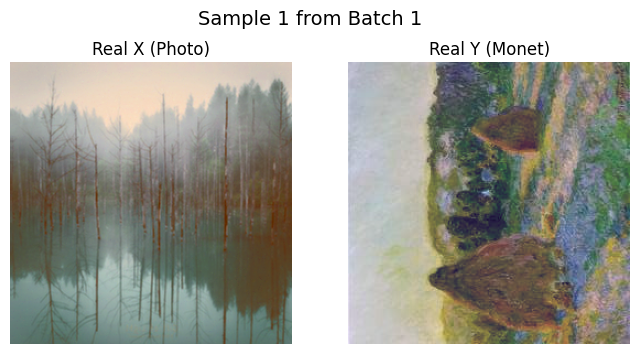

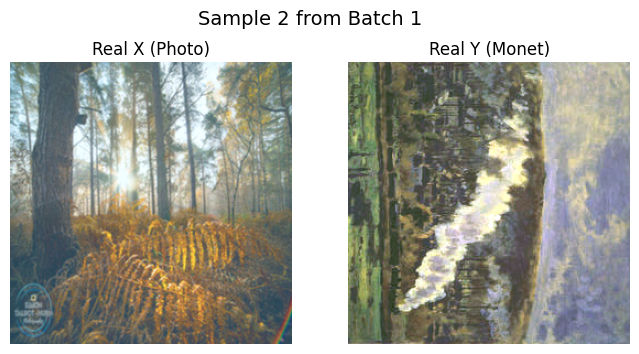

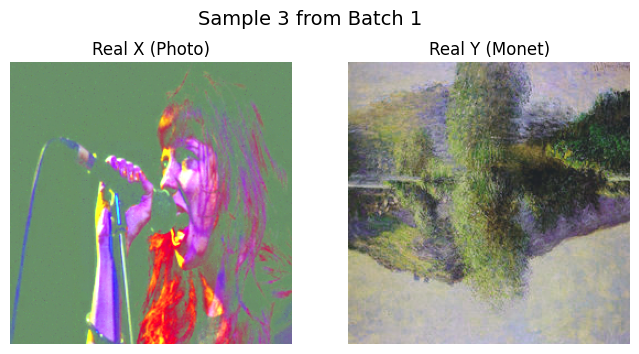


Overall Dataset Statistics:
Total X images checked: 6
Total Y images checked: 6
Average X mean RGB: [ 0.04160909  0.04518841 -0.04742547]
Average X std RGB: [0.3725993  0.34249672 0.3754518 ]
Average Y mean RGB: [ 0.04285789  0.04825796 -0.04519383]
Average Y std RGB: [0.38074625 0.35951856 0.38235298]

✅ All images are properly normalized to [-1, 1].

Verification complete.


In [7]:
# ===========================
# Final Training Pipeline Class for CycleGAN with Enhanced Progress Bar
# ===========================


class CycleGANTrainingPipeline:
    def __init__(self, trainer, train_dataset, steps_per_epoch):
        """
        Initializes the CycleGAN training pipeline.

        Args:
            trainer (CycleGANTrainer): An instance of CycleGANTrainer containing models and optimizers.
            train_dataset (tf.data.Dataset): The training dataset zipped as (real_X, real_Y).
            steps_per_epoch (int): Number of steps per epoch based on dataset size and batch size.
        """
        self.trainer = trainer
        self.train_dataset = train_dataset
        self.steps_per_epoch = steps_per_epoch

        # Setup directories, checkpointing, and logging
        self._setup_directories()
        self._setup_checkpointing()
        self._setup_logging()

        # Extract a batch of real photos for logging
        self.sample_real_X, _ = next(iter(train_dataset))

        print("CycleGAN Training pipeline initialized.")

    def _setup_directories(self):
        """Initialize directory structure for training artifacts."""
        self.dirs = {
            'log': "./logs",
            'checkpoint': "./checkpoints/train",
            'output': "./outputs",
            'model': "./models"
        }
        for dir_path in self.dirs.values():
            os.makedirs(dir_path, exist_ok=True)
        print("✓ Directories set up.")

    def _setup_checkpointing(self):
        """Initialize model checkpointing."""
        self.ckpt = tf.train.Checkpoint(
            generator_G_optimizer=self.trainer.generator_G_optimizer,
            generator_F_optimizer=self.trainer.generator_F_optimizer,
            discriminator_X_optimizer=self.trainer.discriminator_X_optimizer,
            discriminator_Y_optimizer=self.trainer.discriminator_Y_optimizer,
            generator_G=self.trainer.generator_G,
            generator_F=self.trainer.generator_F,
            discriminator_X=self.trainer.discriminator_X,
            discriminator_Y=self.trainer.discriminator_Y
        )

        self.ckpt_manager = tf.train.CheckpointManager(
            self.ckpt, self.dirs['checkpoint'], max_to_keep=5
        )

        # Try to restore checkpoint if it exists
        if self.ckpt_manager.latest_checkpoint:
            self.ckpt.restore(self.ckpt_manager.latest_checkpoint)
            print(f'✓ Latest checkpoint restored from {self.ckpt_manager.latest_checkpoint}')
        else:
            print('No checkpoint found. Initializing from scratch.')

    def _setup_logging(self):
        """Initialize TensorBoard logging and loss tracking."""
        self.summary_writer = tf.summary.create_file_writer(self.dirs['log'])
        self.loss_history = {
            'total_gen_G_loss': [],
            'total_gen_F_loss': [],
            'disc_X_loss': [],
            'disc_Y_loss': [],
            'gen_G_adv_loss': [],
            'gen_F_adv_loss': [],
            'cycle_loss': [],
            'identity_loss_X': [],
            'identity_loss_Y': []
        }
        print("✓ Logging set up.")

    def _generate_samples(self, input_images):
        """
        Generate samples using the generator G (Photo to Monet).

        Args:
            input_images (tf.Tensor): Batch of real photo images.

        Returns:
            tf.Tensor: Batch of generated Monet-style images.
        """
        return self.trainer.generator_G(input_images, training=False)

    def _log_training_images(self, epoch):
        """Generate and log sample images during training."""
        def prepare_for_display(img):
            # Convert from [-1,1] to [0,1] by scaling
            return tf.clip_by_value((img + 1) / 2, 0, 1)

        # Generate Monet-style images from the sample real photos
        generated_images = self._generate_samples(self.sample_real_X)

        images = {
            'Fixed Input': prepare_for_display(self.sample_real_X[0]),
            'Fixed Translation': prepare_for_display(generated_images[0]),
        }

        # Plot and save images
        fig, axes = plt.subplots(1, 2, figsize=(8, 4))
        for ax, (title, img) in zip(axes.flatten(), images.items()):
            ax.imshow(img.numpy())
            ax.set_title(title)
            ax.axis('off')
        plt.tight_layout()
        output_path = os.path.join(self.dirs['output'], f'epoch_{epoch}')
        os.makedirs(output_path, exist_ok=True)
        plt.savefig(f'{output_path}/sample_translation_epoch_{epoch}.jpg')
        plt.close()
        print(f"✓ Sample images saved for epoch {epoch}.")

        # Log images to TensorBoard
        with self.summary_writer.as_default():
            tf.summary.image("Fixed Translation", images['Fixed Translation'][tf.newaxis], step=epoch)

    def _plot_training_history(self):
        """Plot and save training history."""
        epochs = range(1, len(self.loss_history['total_gen_G_loss']) + 1)
        plt.figure(figsize=(12, 8))
        for loss_name, values in self.loss_history.items():
            plt.plot(epochs, values, label=f'{loss_name.replace("_", " ").title()}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Training Loss History')
        plt.legend()
        plt.savefig(f'{self.dirs["output"]}/training_history.jpg')
        plt.close()
        print("✓ Training history plotted and saved.")

    def _save_final_models(self):
        """Save the final generator models."""
        model_dir = self.dirs['model']
        os.makedirs(model_dir, exist_ok=True)
        self.trainer.generator_G.save(os.path.join(model_dir, 'generator_G'))
        self.trainer.generator_F.save(os.path.join(model_dir, 'generator_F'))
        print("✓ Final models saved.")

    def _log_epoch_results(self, epoch, losses):
        """Log losses and update loss history."""
        with self.summary_writer.as_default():
            for loss_name, loss_value in losses.items():
                tf.summary.scalar(loss_name, loss_value, step=epoch)
                print(f"{loss_name}: {loss_value:.4f}")

        for loss_name, loss_value in losses.items():
            self.loss_history[loss_name].append(loss_value.numpy())

    def train(self, epochs=50, patience=10):
        """Train the CycleGAN model with early stopping.

        Args:
            epochs (int): Maximum number of epochs to train.
            patience (int): Number of epochs with no improvement after which training will be stopped.
        """
        early_stopping_patience = patience
        best_total_gen_G_loss = float('inf')
        patience_counter = 0

        for epoch in range(1, epochs + 1):
            start_time = time.time()

            # Initialize progress bar with steps_per_epoch
            progress_bar = tqdm(total=self.steps_per_epoch,
                                desc=f'Epoch {epoch}/{epochs}',
                                unit='batch',
                                leave=True)

            # Reset the dataset iterator
            dataset_iter = iter(self.train_dataset)

            for step in range(1, self.steps_per_epoch + 1):
                try:
                    real_X, real_Y = next(dataset_iter)
                except StopIteration:
                    # Reinitialize the iterator if it runs out
                    dataset_iter = iter(self.train_dataset)
                    real_X, real_Y = next(dataset_iter)

                # Perform a training step
                losses = self.trainer.train_step(real_X, real_Y)

                # Update progress bar description
                progress_bar.set_postfix({
                    'gen_G_loss': f"{losses['total_gen_G_loss']:.4f}",
                    'gen_F_loss': f"{losses['total_gen_F_loss']:.4f}",
                    'disc_X_loss': f"{losses['disc_X_loss']:.4f}",
                    'disc_Y_loss': f"{losses['disc_Y_loss']:.4f}"
                })

                # Update progress bar
                progress_bar.update(1)

            # Close the progress bar
            progress_bar.close()

            # Log epoch results
            self._log_epoch_results(epoch, losses)

            # Save checkpoint
            self.ckpt_manager.save()

            # Log sample images
            self._log_training_images(epoch)

            # Early stopping logic based on total_gen_G_loss
            if losses['total_gen_G_loss'] < best_total_gen_G_loss:
                best_total_gen_G_loss = losses['total_gen_G_loss']
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= early_stopping_patience:
                    print(f"⏹ Early stopping at epoch {epoch} due to no improvement in total_gen_G_loss.")
                    break

            # Epoch summary
            epoch_time = time.time() - start_time
            print(f'Epoch {epoch} completed in {epoch_time:.2f}s')
            print(f"Generator G Loss: {losses['total_gen_G_loss']:.4f}, "
                  f"Generator F Loss: {losses['total_gen_F_loss']:.4f}, "
                  f"Discriminator X Loss: {losses['disc_X_loss']:.4f}, "
                  f"Discriminator Y Loss: {losses['disc_Y_loss']:.4f}\n")

        # Plot training history after all epochs
        self._plot_training_history()

        # Save final models
        self._save_final_models()
        print("✅ Training complete.")

def verify_train_dataset(train_dataset, num_batches=1):
    """
    Verifies the train_dataset by displaying images and checking their properties.

    Args:
        train_dataset (tf.data.Dataset): The training dataset to verify.
        num_batches (int): Number of batches to inspect.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import tensorflow as tf

    # Initialize counters and accumulators for statistics
    total_X_images = 0
    total_Y_images = 0
    X_means = []
    Y_means = []
    X_stds = []
    Y_stds = []

    # Iterate over the dataset
    for batch_idx, (real_X, real_Y) in enumerate(train_dataset.take(num_batches)):
        print(f"\nBatch {batch_idx + 1}/{num_batches}")
        print(f"Real X batch shape: {real_X.shape}, dtype: {real_X.dtype}")
        print(f"Real Y batch shape: {real_Y.shape}, dtype: {real_Y.dtype}")

        # Check value ranges
        X_min = tf.reduce_min(real_X).numpy()
        X_max = tf.reduce_max(real_X).numpy()
        Y_min = tf.reduce_min(real_Y).numpy()
        Y_max = tf.reduce_max(real_Y).numpy()
        print(f"Real X value range: [{X_min:.3f}, {X_max:.3f}]")
        print(f"Real Y value range: [{Y_min:.3f}, {Y_max:.3f}]")

        # Compute statistics
        X_mean = tf.reduce_mean(real_X, axis=[0, 1, 2]).numpy()
        X_std = tf.math.reduce_std(real_X, axis=[0, 1, 2]).numpy()
        Y_mean = tf.reduce_mean(real_Y, axis=[0, 1, 2]).numpy()
        Y_std = tf.math.reduce_std(real_Y, axis=[0, 1, 2]).numpy()

        print(f"Real X mean RGB: {X_mean}")
        print(f"Real X std RGB: {X_std}")
        print(f"Real Y mean RGB: {Y_mean}")
        print(f"Real Y std RGB: {Y_std}")

        # Accumulate statistics
        X_means.append(X_mean)
        Y_means.append(Y_mean)
        X_stds.append(X_std)
        Y_stds.append(Y_std)
        total_X_images += real_X.shape[0]
        total_Y_images += real_Y.shape[0]

        # Display images
        num_samples = min(3, real_X.shape[0])  # Display up to 3 images from the batch
        for i in range(num_samples):
            fig, axes = plt.subplots(1, 2, figsize=(8, 4))
            fig.suptitle(f"Sample {i + 1} from Batch {batch_idx + 1}", fontsize=14)

            # Prepare images for display (scale from [-1, 1] to [0, 1])
            X_image = (real_X[i].numpy() + 1) / 2.0
            Y_image = (real_Y[i].numpy() + 1) / 2.0

            axes[0].imshow(np.clip(X_image, 0, 1))
            axes[0].set_title("Real X (Photo)")
            axes[0].axis('off')

            axes[1].imshow(np.clip(Y_image, 0, 1))
            axes[1].set_title("Real Y (Monet)")
            axes[1].axis('off')

            plt.show()

        # Break after specified number of batches
        if batch_idx + 1 >= num_batches:
            break

    # Compute overall statistics
    overall_X_mean = np.mean(X_means, axis=0)
    overall_X_std = np.mean(X_stds, axis=0)
    overall_Y_mean = np.mean(Y_means, axis=0)
    overall_Y_std = np.mean(Y_stds, axis=0)

    print("\nOverall Dataset Statistics:")
    print(f"Total X images checked: {total_X_images}")
    print(f"Total Y images checked: {total_Y_images}")
    print(f"Average X mean RGB: {overall_X_mean}")
    print(f"Average X std RGB: {overall_X_std}")
    print(f"Average Y mean RGB: {overall_Y_mean}")
    print(f"Average Y std RGB: {overall_Y_std}")

    # Additional checks
    if not np.allclose(X_min, -1.0, atol=0.1) or not np.allclose(X_max, 1.0, atol=0.1):
        print("\n⚠️ Warning: X images are not properly normalized to [-1, 1].")
    if not np.allclose(Y_min, -1.0, atol=0.1) or not np.allclose(Y_max, 1.0, atol=0.1):
        print("\n⚠️ Warning: Y images are not properly normalized to [-1, 1].")
    else:
        print("\n✅ All images are properly normalized to [-1, 1].")

    print("\nVerification complete.")

# Verify the train_dataset
verify_train_dataset(train_dataset, num_batches=1)


In [ ]:
# ===========================
# Environment Cleanup Before Training
# ===========================

K.clear_session()

# Update the variables to delete for CycleGAN
variables_to_delete = [
    'generator_G', 'generator_F',
    'discriminator_X', 'discriminator_Y',
    'loss_fn', 'trainer', 'training_pipeline'
]

for var in variables_to_delete:
    try:
        del globals()[var]
    except KeyError:
        pass

gc.collect()

print("✅ Environment cleared and ready for re-initialization.")

# ===========================
# Re-instantiate Models After Cleanup
# ===========================

def set_random_seeds(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

set_random_seeds()

# Rebuild the Generators and Discriminators
generator_G = build_generator(name='generator_G')  # Generator G: Photo to Monet
generator_F = build_generator(name='generator_F')  # Generator F: Monet to Photo
discriminator_X = build_discriminator(name='discriminator_X')  # Discriminator X: Photos
discriminator_Y = build_discriminator(name='discriminator_Y')  # Discriminator Y: Monet images

print("✓ Generators and Discriminators re-initialized.")

# ===========================
# Final Training Execution
# ===========================

# Set total epochs and patience
total_epochs = 40  # From training_pipeline.train(epochs=40, patience=4)
patience = 10


decay_start_fraction = 0.40
decay_start_epoch = int(total_epochs * decay_start_fraction)

# Set different initial learning rates for generator and discriminator
generator_initial_lr = 1e-6
discriminator_initial_lr = 1e-7  # Lower to prevent discriminator from overpowering generator

# Instantiate the learning rate schedulers
generator_lr_schedule = LinearDecay(generator_initial_lr, decay_start_epoch, total_epochs, steps_per_epoch)
discriminator_lr_schedule = LinearDecay(discriminator_initial_lr, decay_start_epoch, total_epochs, steps_per_epoch)

# Instantiate the optimizers with the learning rate schedulers
generator_G_optimizer = tf.keras.optimizers.Adam(learning_rate=generator_lr_schedule, beta_1=0.5)
generator_F_optimizer = tf.keras.optimizers.Adam(learning_rate=generator_lr_schedule, beta_1=0.5)
discriminator_X_optimizer = tf.keras.optimizers.Adam(learning_rate=discriminator_lr_schedule, beta_1=0.5)
discriminator_Y_optimizer = tf.keras.optimizers.Adam(learning_rate=discriminator_lr_schedule, beta_1=0.5)

# Instantiate the CycleGANLoss
loss_fn = CycleGANLoss(lambda_cycle=10.0, lambda_identity=5.0)

# Instantiate the CycleGANTrainer
trainer = CycleGANTrainer(
    generator_G, generator_F,
    discriminator_X, discriminator_Y,
    loss_fn,
    generator_G_optimizer, generator_F_optimizer,
    discriminator_X_optimizer, discriminator_Y_optimizer
)

# Instantiate the training pipeline
training_pipeline = CycleGANTrainingPipeline(trainer, train_dataset, steps_per_epoch)

# Start the training process
training_pipeline.train(epochs=total_epochs, patience=patience)


✅ Environment cleared and ready for re-initialization.
✓ Generators and Discriminators re-initialized.
✓ Directories set up.
No checkpoint found. Initializing from scratch.
✓ Logging set up.
CycleGAN Training pipeline initialized.



Epoch 1/40:   0%|          | 0/1173 [00:00<?, ?batch/s]2024-11-30 17:25:01.006746: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape ingenerator_F/dropout_9/dropout_1/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer

Epoch 1/40: 100%|██████████| 1173/1173 [07:46<00:00,  2.52batch/s, gen_G_loss=5.6347, gen_F_loss=6.5650, disc_X_loss=1.3243, disc_Y_loss=0.9609]


total_gen_G_loss: 5.6347
total_gen_F_loss: 6.5650
disc_X_loss: 1.3243
disc_Y_loss: 0.9609
gen_G_adv_loss: 1.2472
gen_F_adv_loss: 2.2580
cycle_loss: 3.5290
identity_loss_X: 0.7780
identity_loss_Y: 0.8584
✓ Sample images saved for epoch 1.
Epoch 1 completed in 467.15s
Generator G Loss: 5.6347, Generator F Loss: 6.5650, Discriminator X Loss: 1.3243, Discriminator Y Loss: 0.9609




Epoch 2/40: 100%|██████████| 1173/1173 [06:41<00:00,  2.92batch/s, gen_G_loss=3.7280, gen_F_loss=4.2685, disc_X_loss=0.8160, disc_Y_loss=0.6501]


total_gen_G_loss: 3.7280
total_gen_F_loss: 4.2685
disc_X_loss: 0.8160
disc_Y_loss: 0.6501
gen_G_adv_loss: 0.7610
gen_F_adv_loss: 1.4463
cycle_loss: 2.3580
identity_loss_X: 0.4642
identity_loss_Y: 0.6090
✓ Sample images saved for epoch 2.
Epoch 2 completed in 402.52s
Generator G Loss: 3.7280, Generator F Loss: 4.2685, Discriminator X Loss: 0.8160, Discriminator Y Loss: 0.6501




Epoch 3/40: 100%|██████████| 1173/1173 [06:41<00:00,  2.92batch/s, gen_G_loss=4.2233, gen_F_loss=4.3047, disc_X_loss=0.6524, disc_Y_loss=0.5893]


total_gen_G_loss: 4.2233
total_gen_F_loss: 4.3047
disc_X_loss: 0.6524
disc_Y_loss: 0.5893
gen_G_adv_loss: 0.6669
gen_F_adv_loss: 0.9809
cycle_loss: 2.8065
identity_loss_X: 0.5173
identity_loss_Y: 0.7499
✓ Sample images saved for epoch 3.
Epoch 3 completed in 402.43s
Generator G Loss: 4.2233, Generator F Loss: 4.3047, Discriminator X Loss: 0.6524, Discriminator Y Loss: 0.5893




Epoch 4/40: 100%|██████████| 1173/1173 [06:41<00:00,  2.92batch/s, gen_G_loss=3.8044, gen_F_loss=3.8527, disc_X_loss=0.5309, disc_Y_loss=0.4844]


total_gen_G_loss: 3.8044
total_gen_F_loss: 3.8527
disc_X_loss: 0.5309
disc_Y_loss: 0.4844
gen_G_adv_loss: 0.5899
gen_F_adv_loss: 0.6956
cycle_loss: 2.5931
identity_loss_X: 0.5640
identity_loss_Y: 0.6214
✓ Sample images saved for epoch 4.
Epoch 4 completed in 402.40s
Generator G Loss: 3.8044, Generator F Loss: 3.8527, Discriminator X Loss: 0.5309, Discriminator Y Loss: 0.4844




Epoch 5/40: 100%|██████████| 1173/1173 [06:41<00:00,  2.92batch/s, gen_G_loss=3.3941, gen_F_loss=3.2171, disc_X_loss=0.4231, disc_Y_loss=0.4090]


total_gen_G_loss: 3.3941
total_gen_F_loss: 3.2171
disc_X_loss: 0.4231
disc_Y_loss: 0.4090
gen_G_adv_loss: 0.5394
gen_F_adv_loss: 0.5936
cycle_loss: 2.2321
identity_loss_X: 0.3914
identity_loss_Y: 0.6225
✓ Sample images saved for epoch 5.
Epoch 5 completed in 402.58s
Generator G Loss: 3.3941, Generator F Loss: 3.2171, Discriminator X Loss: 0.4231, Discriminator Y Loss: 0.4090




Epoch 6/40: 100%|██████████| 1173/1173 [06:43<00:00,  2.90batch/s, gen_G_loss=3.1627, gen_F_loss=2.9898, disc_X_loss=0.3825, disc_Y_loss=0.3869]


total_gen_G_loss: 3.1627
total_gen_F_loss: 2.9898
disc_X_loss: 0.3825
disc_Y_loss: 0.3869
gen_G_adv_loss: 0.4720
gen_F_adv_loss: 0.5090
cycle_loss: 2.0940
identity_loss_X: 0.3867
identity_loss_Y: 0.5966
✓ Sample images saved for epoch 6.
Epoch 6 completed in 404.91s
Generator G Loss: 3.1627, Generator F Loss: 2.9898, Discriminator X Loss: 0.3825, Discriminator Y Loss: 0.3869




Epoch 7/40:  74%|███████▍  | 868/1173 [04:58<01:43,  2.94batch/s, gen_G_loss=2.5787, gen_F_loss=2.4602, disc_X_loss=0.3469, disc_Y_loss=0.3083]

# **7. Generating Images**

## **Using the Trained Model**

We'll use the trained **Generator G** (`generator_g`) to convert our photos into Monet-style images.


✓ Generator model loaded.


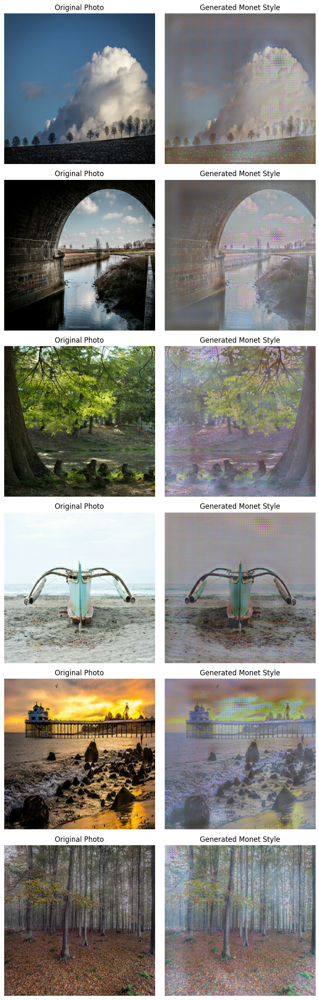

Generating Monet-style images: 220it [00:35,  6.22it/s]


Submission file 'images.zip' created with 7038 generated Monet-style images.

Generation Statistics:
----------------------------------------
Total images generated      : 7038
Generation start timestamp  : 2024-11-29 21:35:47.123565
Generation end timestamp    : 2024-11-29 21:36:22.552092
----------------------------------------
Statistics saved to: ./generated_images/generation_stats.txt


In [9]:
# ===========================
# Final Inference and Submission Code
# ===========================

import os
import tensorflow as tf
import numpy as np
import datetime
import zipfile
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

# Define the PHOTO_PATH
PHOTO_PATH = '/datasets/photo_tfrec/*.tfrec'

# Define the output directories and paths
output_dir = './generated_images'
os.makedirs(output_dir, exist_ok=True)
submission_zip = 'images.zip'

# Load the generator model
generator_G = tf.keras.models.load_model('./models/generator_G')
print("✓ Generator model loaded.")

# Create the dataset from the TFRecords
filenames = tf.io.gfile.glob(PHOTO_PATH)
photo_dataset = tf.data.TFRecordDataset(filenames)

# Parse the images using your existing parse_tfrecord function
photo_dataset = photo_dataset.map(parse_tfrecord, num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Apply augmentation to the photo images
augmented_photo_dataset = photo_dataset.map(augment_photo_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Take a batch of images for display
batch_size = 6

# Get batches of original and augmented images
original_photos = next(iter(photo_dataset.batch(batch_size)))
augmented_photos = next(iter(augmented_photo_dataset.batch(batch_size)))

# Generate images using the trained generator on augmented images
generated_images = generator_G(augmented_photos, training=False)

# Function to denormalize images from [-1,1] to [0,1]
def denormalize_image(image):
    """Convert image from [-1,1] to [0,1]"""
    return (image + 1) / 2

# Plotting
num_images = batch_size
fig, axes = plt.subplots(num_images, 2, figsize=(8, 4 * num_images))

for i in range(num_images):
    ax = axes[i]
    
    original = denormalize_image(original_photos[i]).numpy()
    generated = denormalize_image(generated_images[i]).numpy()
    
    ax[0].imshow(original)
    ax[0].set_title('Original Photo')
    ax[0].axis('off')
    
    ax[1].imshow(generated)
    ax[1].set_title('Generated Monet Style')
    ax[1].axis('off')

plt.tight_layout()
plt.show()

# === Generate Monet-style images and save to images.zip ===

# Batch size for inference
inference_batch_size = 32

# Prepare the augmented dataset for inference
inference_dataset = augmented_photo_dataset.batch(inference_batch_size)

# Variables to track image count and start time for stats
total_images_generated = 0
generation_start_time = datetime.datetime.now()

# Helper function to save an image tensor directly to a zip file
def add_image_to_zip(image_tensor, zip_file, file_name):
    """Convert image tensor to JPEG and write it to the zip file."""
    # Denormalize image to [0, 255]
    image_tensor = (image_tensor + 1.0) * 127.5
    image_tensor = tf.cast(image_tensor, tf.uint8)
    
    # Convert to numpy array and save as JPEG in zip
    img = Image.fromarray(image_tensor.numpy())
    with zip_file.open(file_name, 'w') as img_file:
        img.save(img_file, format='JPEG')

# Generate Monet-style images and save them to `images.zip`
with zipfile.ZipFile(submission_zip, 'w') as zipf:
    for batch in tqdm(inference_dataset, desc='Generating Monet-style images'):
        # Generate images using the trained generator
        generated_batch = generator_G(batch, training=False)
        
        # Process each image in the batch
        for i in range(generated_batch.shape[0]):
            generated_image = generated_batch[i]
            
            # Ensure the image is 256x256 and 3 channels
            generated_image = tf.image.resize(generated_image, [256, 256])
            
            # Save the image in the zip file
            file_name = f'image_{total_images_generated + 1}.jpg'
            add_image_to_zip(generated_image, zipf, file_name)
            
            # Update generated image count
            total_images_generated += 1

print(f"\nSubmission file '{submission_zip}' created with {total_images_generated} generated Monet-style images.")

# === Save and Print Generation Statistics ===
generation_end_time = datetime.datetime.now()
stats_file_path = os.path.join(output_dir, 'generation_stats.txt')
with open(stats_file_path, 'w') as f:
    f.write(f"Total images generated: {total_images_generated}\n")
    f.write(f"Generation start timestamp: {generation_start_time}\n")
    f.write(f"Generation end timestamp: {generation_end_time}\n")

# Print the generation statistics
print("\nGeneration Statistics:")
print("-" * 40)
print(f"Total images generated      : {total_images_generated}")
print(f"Generation start timestamp  : {generation_start_time}")
print(f"Generation end timestamp    : {generation_end_time}")
print("-" * 40)
print(f"Statistics saved to: {stats_file_path}")
